The third problem for Ambiental is to do with Flow Obstructions.

Katie's explanation of problem:

>What we are looking for is a way of identifying locations along the river network that are crossed by bridges, which act as barriers in the Digital Terrain Model (DTM), preventing rivers from flowing freely as they would in reality.

>At the moment, this is a manual process where we draw lines from within the channel on one side of an obstruction to within the channel on the other side. These lines are then processed, and an interpolation is performed between each side of the obstruction, which is then mosaicked onto the DTM.

>Below are examples of the flow obstructions DTM issue before and after being fixed:

![alt text](./flow_obs_ex.png)

>If possible, we would like a single line dataset containing a feature for each flow obstruction within the input DTM, which we can then process using our current methodology. This is unless you are able to suggest a better solution, where the ‘fix’ can be achieved within a single script.

 

In [2]:
import numpy as np
import pylab as plt
%matplotlib inline
import gdal

In [3]:
floodmap=gdal.Open('./data/Ambiental_DataJavelin_FloodMap_QA/Scotland_LiDAR/central_region_test.tif')

In [4]:
arr = floodmap.ReadAsArray()

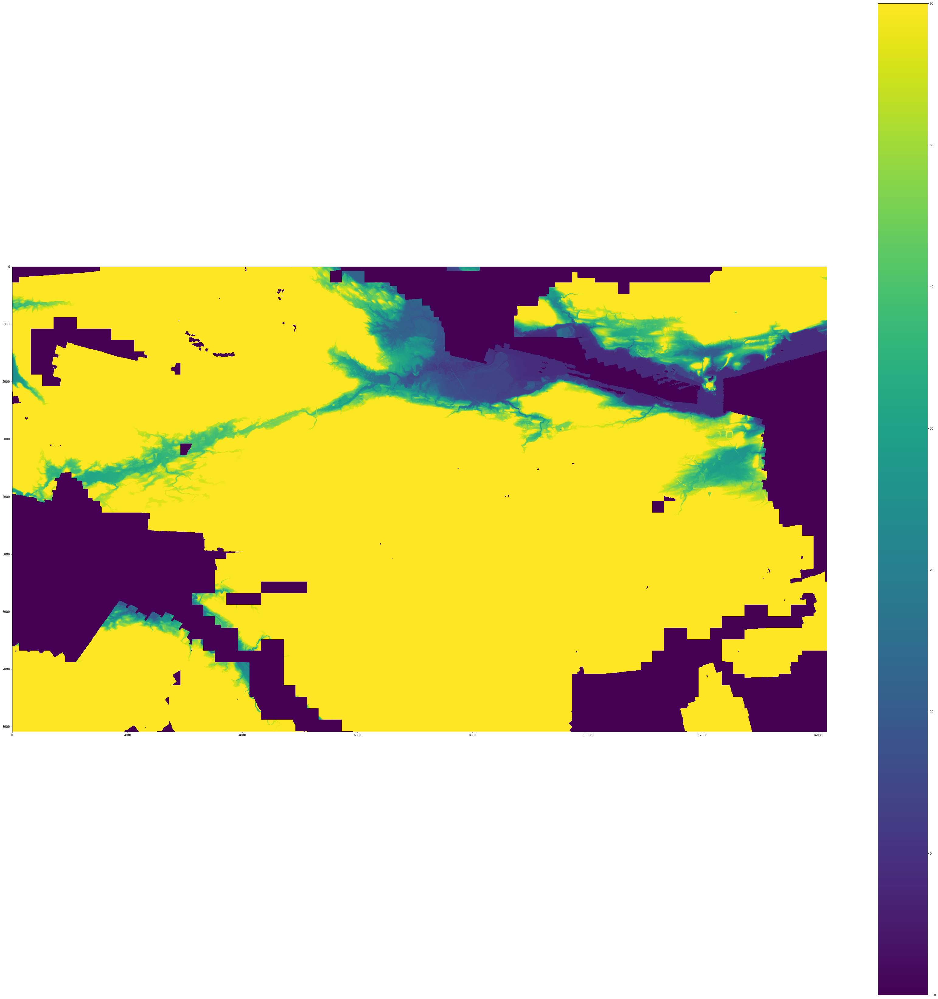

In [5]:
plt.figure(figsize=(60,60))
plt.imshow(arr, vmin=-10,vmax=60)
plt.colorbar()

In [6]:
x,y=np.gradient(arr)
grad=np.sqrt(x**2+y**2)

/Users/pdh21/anaconda3/envs/new/lib/python3.6/site-packages/ipykernel/__main__.py:2: RuntimeWarning: overflow encountered in square
  from ipykernel import kernelapp as app


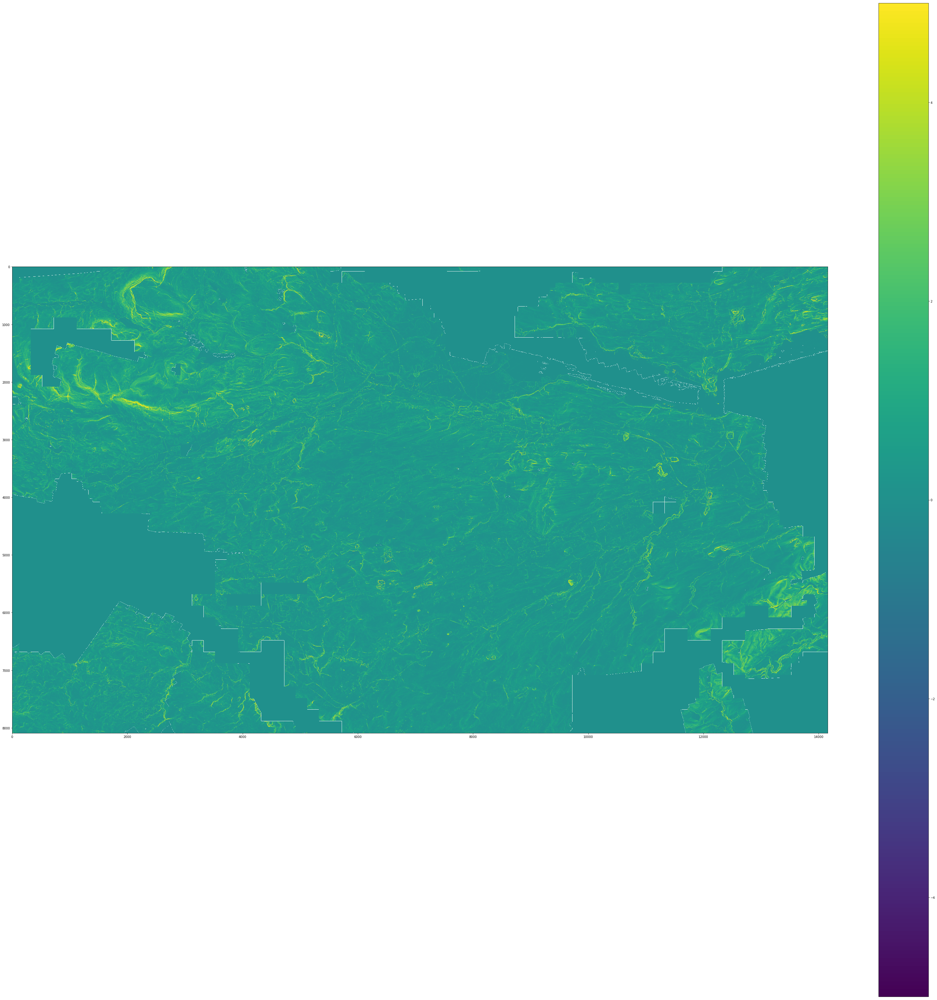

In [7]:
plt.figure(figsize=(60,60))
plt.imshow(grad,vmin=-5,vmax=5)
plt.colorbar()

In [8]:
x,y=np.gradient(grad)
grad2=np.sqrt(x**2+y**2)

/Users/pdh21/anaconda3/envs/new/lib/python3.6/site-packages/numpy/lib/function_base.py:1654: RuntimeWarning: invalid value encountered in subtract
  out[slice1] = (y[slice2] - y[slice3])/2.0
/Users/pdh21/anaconda3/envs/new/lib/python3.6/site-packages/numpy/lib/function_base.py:1660: RuntimeWarning: invalid value encountered in subtract
  out[slice1] = (y[slice2] - y[slice3])
/Users/pdh21/anaconda3/envs/new/lib/python3.6/site-packages/numpy/lib/function_base.py:1666: RuntimeWarning: invalid value encountered in subtract
  out[slice1] = (y[slice2] - y[slice3])


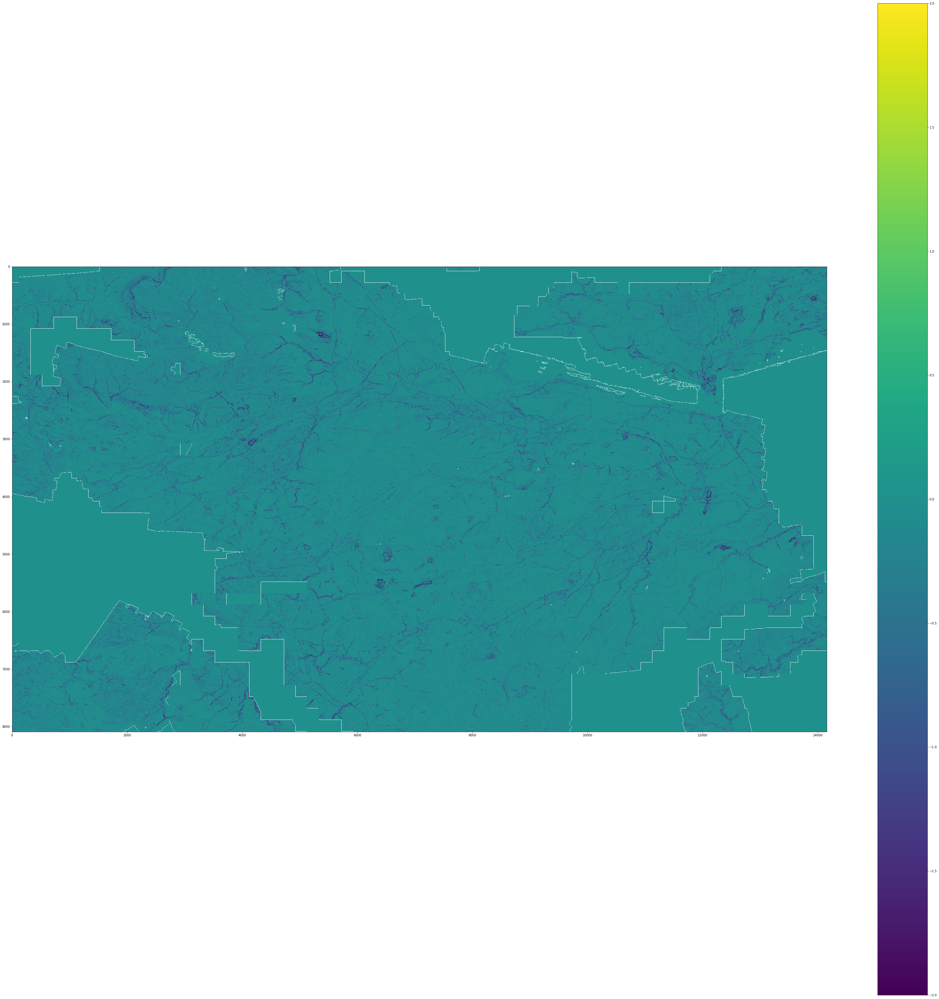

In [9]:
plt.figure(figsize=(60,60))
plt.imshow(-grad2,vmin=-2,vmax=2)
plt.colorbar()

In [10]:
proj_wkt = floodmap.GetProjection()
print(proj_wkt)

PROJCS["British_National_Grid",GEOGCS["GCS_OSGB_1936",DATUM["OSGB_1936",SPHEROID["Airy 1830",6377563.396,299.3249646000043,AUTHORITY["EPSG","7001"]],AUTHORITY["EPSG","6277"]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",49],PARAMETER["central_meridian",-2],PARAMETER["scale_factor",0.9996012717],PARAMETER["false_easting",400000],PARAMETER["false_northing",-100000],UNIT["metre",1,AUTHORITY["EPSG","9001"]]]


In [11]:
from osgeo import osr
proj = osr.SpatialReference()
proj.ImportFromWkt(proj_wkt)
print(proj)

PROJCS["British_National_Grid",
    GEOGCS["GCS_OSGB_1936",
        DATUM["OSGB_1936",
            SPHEROID["Airy 1830",6377563.396,299.3249646000043,
                AUTHORITY["EPSG","7001"]],
            AUTHORITY["EPSG","6277"]],
        PRIMEM["Greenwich",0],
        UNIT["degree",0.0174532925199433]],
    PROJECTION["Transverse_Mercator"],
    PARAMETER["latitude_of_origin",49],
    PARAMETER["central_meridian",-2],
    PARAMETER["scale_factor",0.9996012717],
    PARAMETER["false_easting",400000],
    PARAMETER["false_northing",-100000],
    UNIT["metre",1,
        AUTHORITY["EPSG","9001"]]]
